# Movie Recommendation Predict

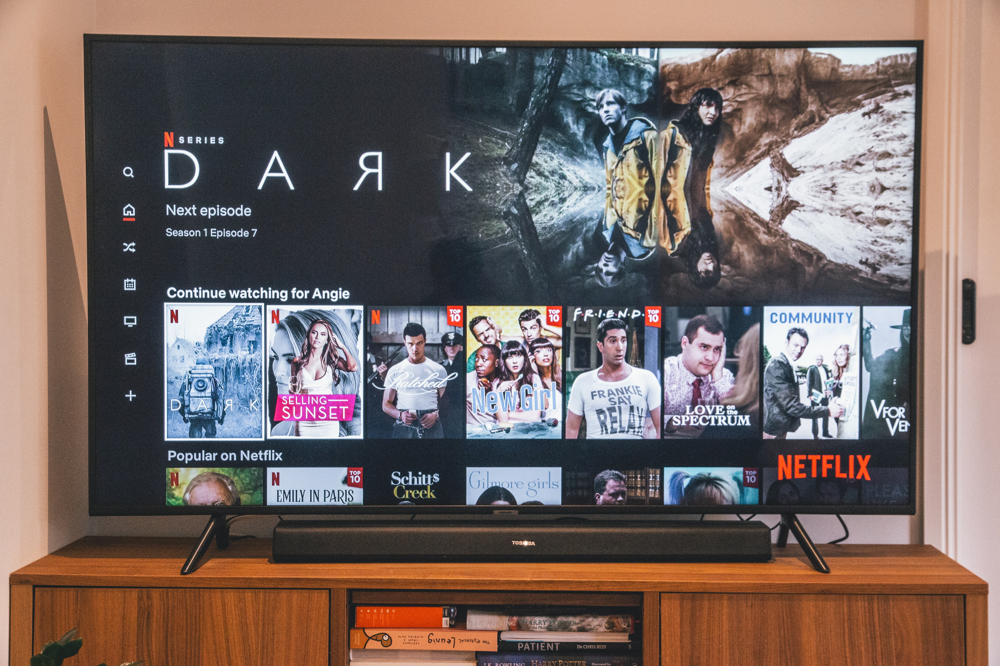

<a id="TOC"></a>
### **Table of Contents**
- [Introduction](#1)
  * [About Machine Learning and Recommender Systems](#2)
  * [Project Overview](#PO)
  * [Problem Statement](#3)
  * [Initializing Comet Experiments](#4)
- [Imports](#5)
  * [Python Library Imports](#6)
  * [Importing the Datasets](#7)
  * [Dataset Descriptions](#8)
- [Data Preprocessing](#9)
  * [Exploratory Data Analysis (EDA)](#10)
- [Recommender Choice](#11)
- [Data Engineering](#12)
- [Content-Based Filter Demo](#13)
- [Modelling](#14)
- [Hyperparameter Tuning](#15)
- [Export Best Prediction to CSV](#16)
- [Pickling Model for Streamlit](#17)
- [Conclusion](#18)
- [Acknowledgements](#19)

<a id="1"></a>
***
## **Introduction**
***

A recommender system, or a recommendation system (sometimes replacing 'system' with a synonym such as platform or engine), is a subclass of information filtering system that provide suggestions for items that are most pertinent to a particular user.[1][2] Typically, the suggestions refer to various decision-making processes, such as what product to purchase, what music to listen to, or what online news to read.[1] Recommender systems are particularly useful when an individual needs to choose an item from a potentially overwhelming number of items that a service may offer.

Recommender systems are used in a variety of areas, with commonly recognised examples taking the form of playlist generators for video and music services, product recommenders for online stores, or content recommenders for social media platforms and open web content recommenders.

In this notebook we will be making a movie recommender system. Below is how the data raw data can be interpreted. This will come in handy as we begin our exploratory data analysis.

* genome_scores.csv - a score mapping the strength between movies and tag-related properties.
* genome_tags.csv - user assigned tags for genome-related scores
* imdb_data.csv - Additional movie metadata scraped from IMDB using the links.csv file.
* links.csv - File providing a mapping between a MovieLens ID and associated IMDB and TMDB IDs.
* tags.csv - User assigned for the movies within the dataset.
* test.csv - The test split of the dataset. Contains user and movie IDs with no rating data.
* train.csv - The training split of the dataset. Contains user and movie IDs with associated rating data.

<a id="4"></a>
## Initializing Comet Experiment

In [179]:
# Import comet_ml at the top of your file
from comet_ml import Experiment

# Create an experiment with your api key
experiment = Experiment(
    api_key="57B8imkkx3n03ZL9ZYRH1xB5w",
    project_name="unsupervised-learning",
    workspace="leratolira2",
)


COMET INFO: ---------------------------
COMET INFO: Comet.ml Experiment Summary
COMET INFO: ---------------------------
COMET INFO:   Data:
COMET INFO:     display_summary_level : 1
COMET INFO:     url                   : https://www.comet.com/i-am-praise/movie-recommendation/0a1d2ee3cfe74d8ab9d3bb40af8dfa9f
COMET INFO:   Uploads:
COMET INFO:     conda-info               : 1
COMET INFO:     conda-specification      : 1
COMET INFO:     environment details      : 1
COMET INFO:     filename                 : 1
COMET INFO:     git metadata             : 1
COMET INFO:     git-patch (uncompressed) : 1 (6.86 KB)
COMET INFO:     installed packages       : 1
COMET INFO:     notebook                 : 1
COMET INFO:     source_code              : 1
COMET INFO: ---------------------------
COMET WARNING: As you are running in a Jupyter environment, you will need to call `experiment.end()` when finished to ensure all metrics and code are logged before exiting.
COMET INFO: Experiment is live on comet

<a id="5"></a>
***
## **Imports**
***

<a id="6"></a>
### **Python Library Imports**

In [47]:
# Packages for data processing
import numpy as np
import pandas as pd
import random
from sklearn import preprocessing
from sklearn.datasets import make_blobs
from sklearn.preprocessing import StandardScaler
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
import re
from scipy.sparse import csr_matrix
import scipy as sp



# Package to suppress warnings
import warnings
warnings.filterwarnings("ignore")


# Packages for visualization
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
sns.set(font_scale=1)
sns.set_style("dark")
pd.set_option('display.max_columns', 37)
import warnings
warnings.filterwarnings('ignore')
from IPython.display import display_html 
from IPython.core.display import HTML
from collections import defaultdict
from datetime import datetime
import re
import os


# Packages for modeling
from surprise import Reader
from surprise import Dataset
from surprise import accuracy
from surprise import KNNWithMeans, KNNWithZScore
from surprise import KNNBasic, KNNBaseline
from surprise.model_selection import cross_validate, train_test_split
from surprise.model_selection import GridSearchCV
from surprise import SVD
from surprise import SVDpp
from surprise import NMF
from surprise import SlopeOne
from surprise import CoClustering
from surprise import NormalPredictor
from surprise import BaselineOnly
import heapq


# Packages for saving models
import pickle
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator


# Packages for model evaluation
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from time import time


<a id="7"></a>

### Importing Data

In [74]:
scores = pd.read_csv("genome_scores.csv")
gen_tags = pd.read_csv("genome_tags.csv")
imdb = pd.read_csv("imdb_data.csv")
links = pd.read_csv("links.csv")
movies = pd.read_csv("movies.csv")
tags = pd.read_csv("tags.csv")
train = pd.read_csv("train.csv")
test = pd.read_csv("test.csv")

<a id="8"></a>

### Data description

In [3]:
scores.info()
scores.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15584448 entries, 0 to 15584447
Data columns (total 3 columns):
 #   Column     Dtype  
---  ------     -----  
 0   movieId    int64  
 1   tagId      int64  
 2   relevance  float64
dtypes: float64(1), int64(2)
memory usage: 356.7 MB


,movieId,tagId,relevance
0,1,1,0.02875
1,1,2,0.02375
2,1,3,0.06250
3,1,4,0.07575
4,1,5,0.14075


In [4]:
gen_tags.info()
gen_tags.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1128 entries, 0 to 1127
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   tagId   1128 non-null   int64 
 1   tag     1128 non-null   object
dtypes: int64(1), object(1)
memory usage: 17.8+ KB


,tagId,tag
0,1,007
1,2,007 (series)
2,3,18th century
3,4,1920s
4,5,1930s


In [5]:
imdb.info()
imdb.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27278 entries, 0 to 27277
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   movieId        27278 non-null  int64  
 1   title_cast     17210 non-null  object 
 2   director       17404 non-null  object 
 3   runtime        15189 non-null  float64
 4   budget         7906 non-null   object 
 5   plot_keywords  16200 non-null  object 
dtypes: float64(1), int64(1), object(4)
memory usage: 1.2+ MB


,movieId,title_cast,director,runtime,budget,plot_keywords
0,1,Tom Hanks|Tim Allen|Don Rickles|Jim Varney|Wal...,John Lasseter,81.0,"$30,000,000",toy|rivalry|cowboy|cgi animation
1,2,Robin Williams|Jonathan Hyde|Kirsten Dunst|Bra...,Jonathan Hensleigh,104.0,"$65,000,000",board game|adventurer|fight|game
2,3,Walter Matthau|Jack Lemmon|Sophia Loren|Ann-Ma...,Mark Steven Johnson,101.0,"$25,000,000",boat|lake|neighbor|rivalry
3,4,Whitney Houston|Angela Bassett|Loretta Devine|...,Terry McMillan,124.0,"$16,000,000",black american|husband wife relationship|betra...
4,5,Steve Martin|Diane Keaton|Martin Short|Kimberl...,Albert Hackett,106.0,"$30,000,000",fatherhood|doberman|dog|mansion


In [6]:
links.info()
links.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62423 entries, 0 to 62422
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   movieId  62423 non-null  int64  
 1   imdbId   62423 non-null  int64  
 2   tmdbId   62316 non-null  float64
dtypes: float64(1), int64(2)
memory usage: 1.4 MB


,movieId,imdbId,tmdbId
0,1,114709,862.0
1,2,113497,8844.0
2,3,113228,15602.0
3,4,114885,31357.0
4,5,113041,11862.0


In [7]:
movies.info()
movies.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62423 entries, 0 to 62422
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   movieId  62423 non-null  int64 
 1   title    62423 non-null  object
 2   genres   62423 non-null  object
dtypes: int64(1), object(2)
memory usage: 1.4+ MB


,movieId,title,genres
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy
1,2,Jumanji (1995),Adventure|Children|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance
4,5,Father of the Bride Part II (1995),Comedy


In [8]:
tags.info()
tags.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1093360 entries, 0 to 1093359
Data columns (total 4 columns):
 #   Column     Non-Null Count    Dtype 
---  ------     --------------    ----- 
 0   userId     1093360 non-null  int64 
 1   movieId    1093360 non-null  int64 
 2   tag        1093344 non-null  object
 3   timestamp  1093360 non-null  int64 
dtypes: int64(3), object(1)
memory usage: 33.4+ MB


,userId,movieId,tag,timestamp
0,3,260,classic,1439472355
1,3,260,sci-fi,1439472256
2,4,1732,dark comedy,1573943598
3,4,1732,great dialogue,1573943604
4,4,7569,so bad it's good,1573943455


In [9]:
train.info()
train.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000038 entries, 0 to 10000037
Data columns (total 4 columns):
 #   Column     Dtype  
---  ------     -----  
 0   userId     int64  
 1   movieId    int64  
 2   rating     float64
 3   timestamp  int64  
dtypes: float64(1), int64(3)
memory usage: 305.2 MB


,userId,movieId,rating,timestamp
0,5163,57669,4.0,1518349992
1,106343,5,4.5,1206238739
2,146790,5459,5.0,1076215539
3,106362,32296,2.0,1423042565
4,9041,366,3.0,833375837


In [10]:
test.info()
test.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000019 entries, 0 to 5000018
Data columns (total 2 columns):
 #   Column   Dtype
---  ------   -----
 0   userId   int64
 1   movieId  int64
dtypes: int64(2)
memory usage: 76.3 MB


,userId,movieId
0,1,2011
1,1,4144
2,1,5767
3,1,6711
4,1,7318


<a id="9"></a>
***
## **Data Preprocessing**
***

### On the dataset that we are going to use, we will check and remove null values

In [11]:
print("Number of null values in our dataset : ", sum(gen_tags.isnull().any()))

Number of null values in our dataset :  0


In [12]:
print("Number of null values in our dataset : ", sum(imdb.isnull().any()))

Number of null values in our dataset :  5


In [13]:
print("Number of null values in our dataset : ", sum(movies.isnull().any()))

Number of null values in our dataset :  0


In [14]:
print("Number of null values in our dataset : ", sum(train.isnull().any()))

Number of null values in our dataset :  0


In [15]:
print("Number of null values in our dataset : ", sum(test.isnull().any()))

Number of null values in our dataset :  0


### Here we will check and remove all the duplicate values 

In [16]:
#Removing duplicate entries for title, genres and movieId in the movies dataset 

duplicates = movies.duplicated(['movieId', 'title', 'genres'])
dupli = sum(duplicates) 


print("There are {} duplicates rating entries in the dataset".format(dupli))

There are 0 duplicates rating entries in the dataset


In [17]:
#Checking how many users and movies are there and if there are any duplicates in the train dataset

users = len(train.userId.unique())
number_of_unique_movies = len(train.movieId.unique())


print('There are {} unique users and {}\
 unique movies in the train dataset with {} duplicate entries'.format(users, movies, train[train.duplicated()].count().sum()))

There are 162541 unique users and        movieId                               title  \
0            1                    Toy Story (1995)   
1            2                      Jumanji (1995)   
2            3             Grumpier Old Men (1995)   
3            4            Waiting to Exhale (1995)   
4            5  Father of the Bride Part II (1995)   
...        ...                                 ...   
62418   209157                           We (2018)   
62419   209159           Window of the Soul (2001)   
62420   209163                    Bad Poems (2018)   
62421   209169                 A Girl Thing (2001)   
62422   209171      Women of Devil's Island (1962)   

                                            genres  
0      Adventure|Animation|Children|Comedy|Fantasy  
1                       Adventure|Children|Fantasy  
2                                   Comedy|Romance  
3                             Comedy|Drama|Romance  
4                                           Comedy  

In [18]:
#Remove duplicate entries for movieId and userId in the test dataset 

duplicates = test.duplicated(['userId','movieId'])
dupli = sum(duplicates) 


print("There are {} duplicates rating entries in the dataset".format(dupli))

There are 0 duplicates rating entries in the dataset


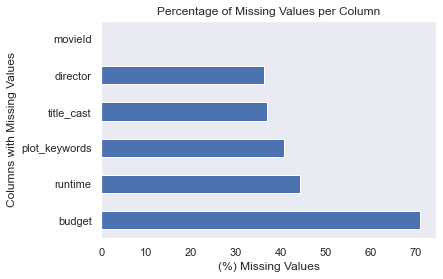

In [19]:
#Calculating the percentage of missing values in each column of the imdb dataset

total = imdb.isnull().sum().sort_values(ascending=False)
percent_1 = imdb.isnull().sum()/imdb.isnull().count()*100
percent_2 = (round(percent_1, 1)).sort_values(ascending=False)
missing_data = pd.concat([total, percent_2],
                         axis=1, keys=['Total', '(%) missing'])
missing_data['(%) missing'].plot(kind='barh')
plt.xlabel('(%) Missing Values')
plt.ylabel('Columns with Missing Values')
plt.title('Percentage of Missing Values per Column')
plt.show()

From the above observation, we can see that there is a lot of missing values in this dataset hence it cannot be used as it is for modelling purposes

Here we are going to extract the movie year to another column named "movie_year"

In [20]:
# Extracting movie release years into one column

movies['movie_year'] = movies.title.str.extract("\s\((\d{4})\)$")
movies.head()

,movieId,title,genres,movie_year
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,1995
1,2,Jumanji (1995),Adventure|Children|Fantasy,1995
2,3,Grumpier Old Men (1995),Comedy|Romance,1995
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance,1995
4,5,Father of the Bride Part II (1995),Comedy,1995


In [21]:
# Removing year from the movie titles

movies['title'] = movies.title.str.split('(').str[0].str[:-1]
movies.head()

,movieId,title,genres,movie_year
0,1,Toy Story,Adventure|Animation|Children|Comedy|Fantasy,1995
1,2,Jumanji,Adventure|Children|Fantasy,1995
2,3,Grumpier Old Men,Comedy|Romance,1995
3,4,Waiting to Exhale,Comedy|Drama|Romance,1995
4,5,Father of the Bride Part II,Comedy,1995


In [22]:
# Merge train (users) and movies datasets on movieId column

dftrain_movies = pd.merge(train,
                           movies,
                           how='left',
                           on='movieId')

# Perform a further merge with imdb_data on movieId column

dfmovies_metadata = pd.merge(dftrain_movies,
                              imdb,
                              how='left',
                              on='movieId')

dfmovies_metadata.head(3)

,userId,movieId,rating,timestamp,title,genres,movie_year,title_cast,director,runtime,budget,plot_keywords
0,5163,57669,4.0,1518349992,In Bruges,Comedy|Crime|Drama|Thriller,2008,Elizabeth Berrington|Rudy Blomme|Olivier Bonjo...,Martin McDonagh,107.0,"$15,000,000",dwarf|bruges|irish|hitman
1,106343,5,4.5,1206238739,Father of the Bride Part II,Comedy,1995,Steve Martin|Diane Keaton|Martin Short|Kimberl...,Albert Hackett,106.0,"$30,000,000",fatherhood|doberman|dog|mansion
2,146790,5459,5.0,1076215539,Men in Black II,Action|Comedy|Sci-Fi,2002,Tommy Lee Jones|Will Smith|Rip Torn|Lara Flynn...,Lowell Cunningham,88.0,"$140,000,000",lingerie|michael jackson character|shorthaired...


In [23]:
imdb['title_cast']=imdb['title_cast'].str.split('|') #spliting the title cast into a list
imdb['plot_keywords']=imdb['plot_keywords'].str.split('|') #spliting the Key words into a list
imdb.head()

,movieId,title_cast,director,runtime,budget,plot_keywords
0,1,"[Tom Hanks, Tim Allen, Don Rickles, Jim Varney...",John Lasseter,81.0,"$30,000,000","[toy, rivalry, cowboy, cgi animation]"
1,2,"[Robin Williams, Jonathan Hyde, Kirsten Dunst,...",Jonathan Hensleigh,104.0,"$65,000,000","[board game, adventurer, fight, game]"
2,3,"[Walter Matthau, Jack Lemmon, Sophia Loren, An...",Mark Steven Johnson,101.0,"$25,000,000","[boat, lake, neighbor, rivalry]"
3,4,"[Whitney Houston, Angela Bassett, Loretta Devi...",Terry McMillan,124.0,"$16,000,000","[black american, husband wife relationship, be..."
4,5,"[Steve Martin, Diane Keaton, Martin Short, Kim...",Albert Hackett,106.0,"$30,000,000","[fatherhood, doberman, dog, mansion]"


In [24]:
#removing all commas

imdb['budget'] = imdb['budget'].str.replace(',', '')

#removing all currency signs

imdb['budget'] = imdb['budget'].str.extract('(\d+)', expand=False)

#converting a feature into a float

imdb['budget'] = imdb['budget'].astype(float)

#removing null values and replacing them with a 0

imdb['budget'] = imdb['budget'].replace(np.nan,0)

#converting a feature into an integer

imdb['budget'] = imdb['budget'].astype(int)

In [25]:
imdb = pd.read_csv("imdb_data.csv")

imdb['title_cast']=imdb['title_cast'].str.split('|') #spliting the title cast into a list
imdb['plot_keywords']=imdb['plot_keywords'].str.split('|') #spliting the Key words into a list

imdb.head()

,movieId,title_cast,director,runtime,budget,plot_keywords
0,1,"[Tom Hanks, Tim Allen, Don Rickles, Jim Varney...",John Lasseter,81.0,"$30,000,000","[toy, rivalry, cowboy, cgi animation]"
1,2,"[Robin Williams, Jonathan Hyde, Kirsten Dunst,...",Jonathan Hensleigh,104.0,"$65,000,000","[board game, adventurer, fight, game]"
2,3,"[Walter Matthau, Jack Lemmon, Sophia Loren, An...",Mark Steven Johnson,101.0,"$25,000,000","[boat, lake, neighbor, rivalry]"
3,4,"[Whitney Houston, Angela Bassett, Loretta Devi...",Terry McMillan,124.0,"$16,000,000","[black american, husband wife relationship, be..."
4,5,"[Steve Martin, Diane Keaton, Martin Short, Kim...",Albert Hackett,106.0,"$30,000,000","[fatherhood, doberman, dog, mansion]"


In [26]:
#For uniformity and better utilisation on the app. 
## We convert director names into smaller letters and drop null  values.

imdb['director'] = imdb['director'].apply(lambda x: x.lower() if x == x else np.nan)

imdb['plot_keywords'] = imdb['plot_keywords'].dropna()

# This join makes sure imdb is added to movies and all movie rows are kept

movies_imdb = movies.join(imdb.set_index('movieId'),on='movieId')

movies_imdb.head()

,movieId,title,genres,movie_year,title_cast,director,runtime,budget,plot_keywords
0,1,Toy Story,Adventure|Animation|Children|Comedy|Fantasy,1995,"[Tom Hanks, Tim Allen, Don Rickles, Jim Varney...",john lasseter,81.0,"$30,000,000","[toy, rivalry, cowboy, cgi animation]"
1,2,Jumanji,Adventure|Children|Fantasy,1995,"[Robin Williams, Jonathan Hyde, Kirsten Dunst,...",jonathan hensleigh,104.0,"$65,000,000","[board game, adventurer, fight, game]"
2,3,Grumpier Old Men,Comedy|Romance,1995,"[Walter Matthau, Jack Lemmon, Sophia Loren, An...",mark steven johnson,101.0,"$25,000,000","[boat, lake, neighbor, rivalry]"
3,4,Waiting to Exhale,Comedy|Drama|Romance,1995,"[Whitney Houston, Angela Bassett, Loretta Devi...",terry mcmillan,124.0,"$16,000,000","[black american, husband wife relationship, be..."
4,5,Father of the Bride Part II,Comedy,1995,"[Steve Martin, Diane Keaton, Martin Short, Kim...",albert hackett,106.0,"$30,000,000","[fatherhood, doberman, dog, mansion]"


<a id="10"></a>
***
### **Exploratory Data Analysis (EDA)**
***

### Genres


In [27]:
movies_gen_gen = movies

In [28]:
# Creating a dataframe containing only the movieId and genres
movies_genres = pd.DataFrame(movies_gen_gen[['movieId', 'genres']],
                             columns=['movieId', 'genres'])


# Split genres seperated by "|" and create a list containing the genres allocated to each movie
movies_genres.genres = movies_genres.genres.apply(lambda x: x.split('|'))


# Create expanded dataframe where each movie-genre combination is in a seperate row
movies_genres = pd.DataFrame([(tup.movieId, d) for tup in movies_genres.itertuples() for d in tup.genres],
                             columns=['movieId', 'genres'])


movies_genres.head()

,movieId,genres
0,1,Adventure
1,1,Animation
2,1,Children
3,1,Comedy
4,1,Fantasy


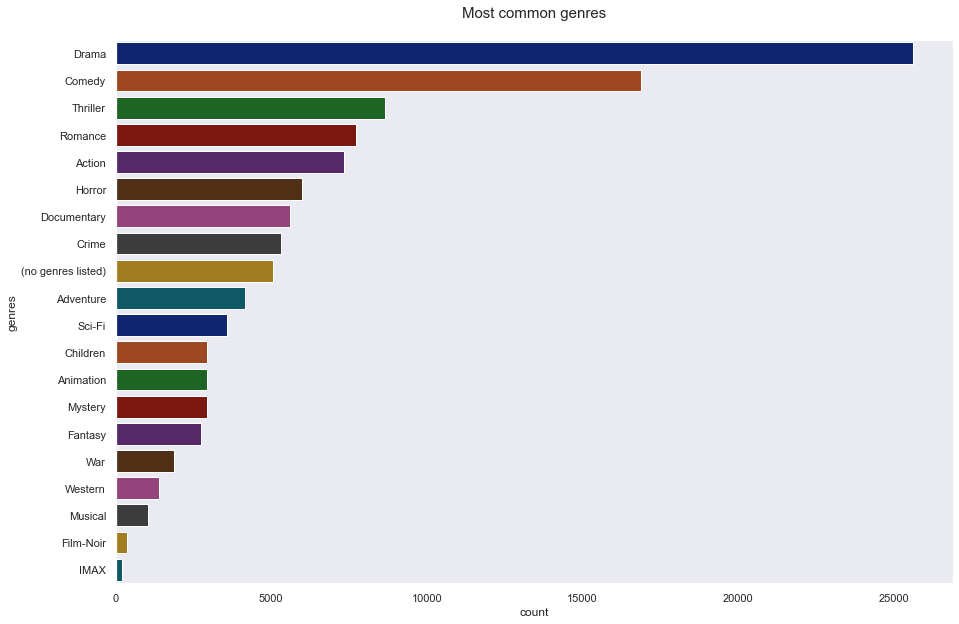

In [29]:
# Plot the genres from most common to least common

plot = plt.figure(figsize=(15, 10))
plt.title('Most common genres\n', fontsize=15)
sns.countplot(y="genres", data=movies_genres,
              order=movies_genres['genres'].value_counts(ascending=False).index,
              palette="dark")

plt.show()

Drama is the most common genre, meaning that most movies are drama films, then Comedy followed by Thriller, Romance, Action, Horror, Documentary, Crime, Adventure, Science Fiction, Children, Animation, Mystery and Fantasy. IMAX is the least common genre since it is the most expensive so few people watch it, it is only available at the cinema and not streaming platforms such as Netflix.

### Number of Movies for Each Genre

In [32]:
unique_movies = movies.drop_duplicates('title')
unique_movies = unique_movies['genres'].str.split('|', expand=True).stack().value_counts()
fig = px.bar(unique_movies, x=unique_movies.index, y=unique_movies, text=unique_movies,
             labels={
                 "index": "Genres",
                 'y': 'Number of Movies'},
             color=unique_movies
             )
fig.update_traces(textposition='outside')
fig.update_layout(title_text='Number of Movies for each Genre',
                  title_x=0.5, title_font=dict(size=24))
fig.update_traces(marker=dict(line=dict(color='#000000', width=2)))
fig.update_layout({'plot_bgcolor': 'rgba(0, 0, 0, 0)'})
fig.show()

### Plot Keywords wordcloud

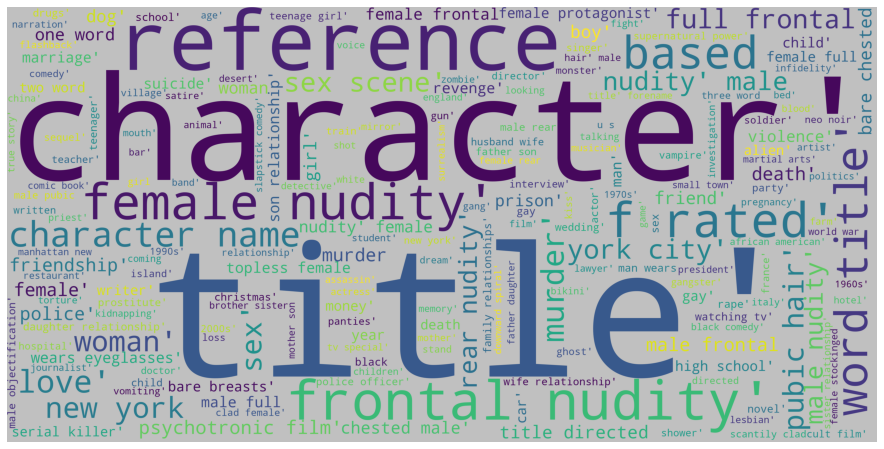

In [33]:
plot_cloud = imdb.loc[:,'plot_keywords'] = imdb.loc[:, 'plot_keywords'].astype(str)
plot_cloud.dropna()
plot_cloud = [x for x in plot_cloud if str(x) != 'nan']
title_corpus = ' '.join(movies['title'])
plot_corpus = ' '.join(plot_cloud)


# Generate wordcloud for the plot keywords of movies
plot_wordcloud = WordCloud(stopwords=STOPWORDS, background_color='silver', height=2000, width=4000).generate(plot_corpus)
plt.figure(figsize=(16,8))
plt.imshow(plot_wordcloud)
plt.axis('off')
plt.show()

From the observation above, we can see that there is emphasis on the words "Frontal nudity", "Male nudity", "Female nudity", "Murder", "Love", "Pubic hair" and "Sex"

### Ratings

Average rating in the dataset: 3.5333951730983424


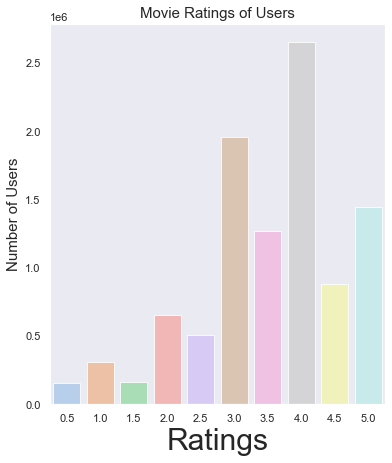

In [34]:
print (f'Average rating in the dataset: {np.mean(train["rating"])}')



#bar graph plot to show the ratings of movies given by users
cnt_srs = train['rating'].value_counts()


plt.figure(figsize=(6,7))
sns.barplot(cnt_srs.index, cnt_srs.values, alpha=0.8,palette='pastel')
plt.title('Movie Ratings of Users', fontsize=15)
plt.ylabel('Number of Users', fontsize=15)
plt.xlabel('Ratings', fontsize=30)
plt.xticks([0,1,2,3,4,5,6,7,8,9],['0.5','1.0','1.5','2.0','2.5','3.0','3.5','4.0','4.5','5.0'])
plt.show()

The mode ranking in the chart above is 4.0. It appears that users tend to provide whole-number ratings (e.g. 4.0) as opposed to fractional ratings (e.g. 3.5). The mean rating of approx 3.5 shows that users typically lean towards more favourable ratings and are not excessively harsh in their criticism. There are few ratings below 2.0., it could be that users tend to only rate those movies that they enjoy. Many users might terminate an unenjoyable movie mid-stream without bothering to give it a rating. 

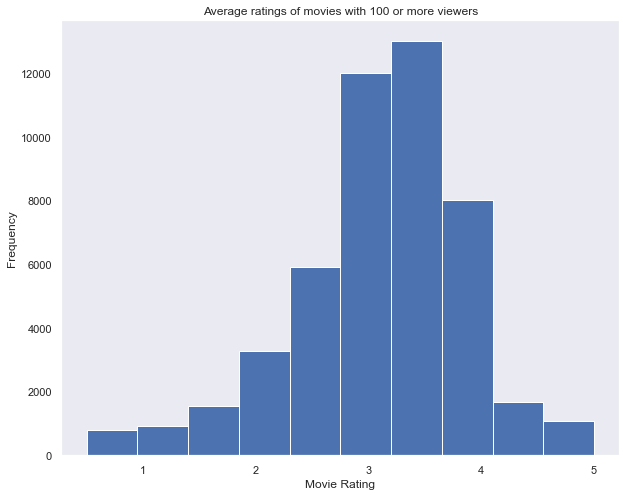

In [35]:
# Calculate average rating for each movie and arrange from highest to lowest
movies_ranking = dfmovies_metadata[['title','rating']].groupby('title').mean().sort_values('rating', ascending=False)


movies_ranking['No_of_ratings'] = dfmovies_metadata.groupby('title')['rating'].count()


a = movies_ranking.sort_values(by=['No_of_ratings', 'rating'], ascending=False).head()


# Average rating of movies in the dataset
avg_rating = train.groupby('movieId')['rating'].mean()

# Plotting the results
plt.figure(figsize=(10,8))
avg_rating.plot(kind='hist')
plt.ylabel('Frequency')
plt.xlabel('Movie Rating')
plt.title('Average ratings of movies with 100 or more viewers')
plt.show()

Most of the movies are not common and were watched by a few number of people, so even if two people rated the movie 5 stars it wouldn't be enough to classify a movie as a 5 star rated movie so 100 is a fair number.

Most people rated the movie between 3 and 4 because they probably felt that a rating of 5 would be overrating the movie.

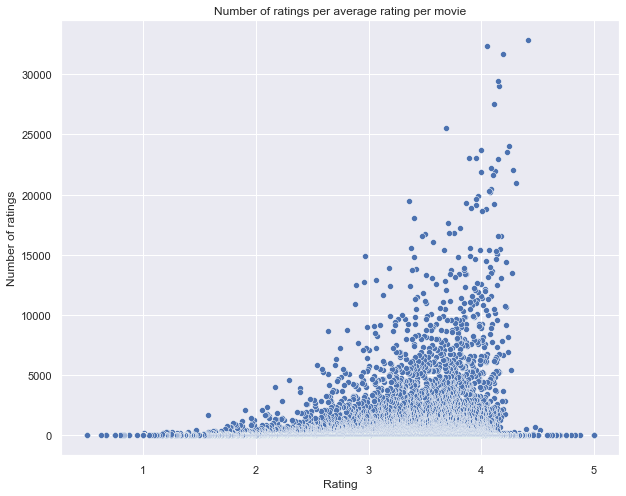

In [36]:
# Set plot size
sns.set(rc={'figure.figsize':(10,8)})


# Plot Number of rating for every rating category.
sns.scatterplot(x='rating', y='No_of_ratings', data=movies_ranking)
plt.title('Number of ratings per average rating per movie')
plt.xlabel('Rating')
plt.ylabel('Number of ratings')
plt.show()

This plot shows that movies that receive a higher number of ratings also tend to receive higher rating scores, this leads to the popular belief that popular movies (movies with high number of views) are highly rated. In the plot above, it can be seen that movies with more than 100 ratings obtain a rating of 3.5 as their mode.

The ratings do not start from zero because the minimum rating one can give is 0.5 or 1 star.

The table below shows the correlation between ratings count and rating (score) for each movie director. Those directors whose movies have received the most number of ratings also get higher rating scores for their movies.

In [37]:
best_director = pd.DataFrame(dfmovies_metadata.groupby('director')['rating'].mean().
                             sort_values(ascending=False))
best_director['No_of_ratings'] = dfmovies_metadata.groupby('director')['rating'].count()
best_director.sort_values(by=['No_of_ratings', 'rating'], ascending=False).head(10)

,rating,No_of_ratings
director,,
Quentin Tarantino,3.936571,109919
Michael Crichton,3.273370,65157
J.R.R. Tolkien,4.080118,62963
Lilly Wachowski,3.808348,60988
Stephen King,4.049956,59903
Ethan Coen,3.947250,51185
James Cameron,3.687102,51178
Luc Besson,3.749676,44015
Jonathan Nolan,4.100516,42645


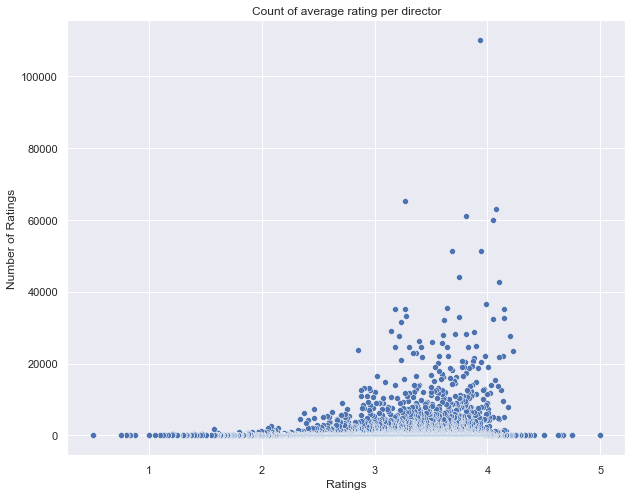

In [38]:
#A visual indication of the correlation between number of ratings and rating scores for directors.

# Set plot size
sns.set(rc={'figure.figsize':(10,8)})


sns.scatterplot(x = 'rating', y = 'No_of_ratings', data = best_director).set_title('Count of average rating per director')
plt.xlabel('Ratings')
plt.ylabel('Number of Ratings')
plt.show()

Majority of people who gave ratings gave a rating of above 2.5. Most people rate a movie based on the director and not the content hence we would assume that they felt that a rating between 3 and 4 is more appropriate.

### Number of Ratings given by the Users Monthly

In [48]:
def UNIX_to_Readable(df):
    return pd.to_datetime(datetime.fromtimestamp(df).strftime('%Y-%m-%d %H:%M:%S'))

# Converting Unix date-format to readable format
tags.timestamp = tags.timestamp.apply(UNIX_to_Readable)
tags.head()

,userId,movieId,tag,timestamp
0,3,260,classic,2015-08-13 15:25:55
1,3,260,sci-fi,2015-08-13 15:24:16
2,4,1732,dark comedy,2019-11-17 00:33:18
3,4,1732,great dialogue,2019-11-17 00:33:24
4,4,7569,so bad it's good,2019-11-17 00:30:55


In [49]:
num_of_rating_weekly = tags.resample('m', on='timestamp').size()
fig = px.line(num_of_rating_weekly, x=num_of_rating_weekly.index, y=num_of_rating_weekly,
              labels={'y': 'Number of Ratings given',
                      'timestamp': 'Months'})
fig.update_layout(title_text='Number of Ratings given by the Users Monthly',
                  title_x=0.5, title_font=dict(size=20))
fig.update_layout({'plot_bgcolor': 'rgba(0, 0, 0, 0)'})
fig.update_traces(line=dict(width=3))
fig.show()

In [50]:
movies.head()

,movieId,title,genres,movie_year
0,1,Toy Story,Adventure|Animation|Children|Comedy|Fantasy,1995
1,2,Jumanji,Adventure|Children|Fantasy,1995
2,3,Grumpier Old Men,Comedy|Romance,1995
3,4,Waiting to Exhale,Comedy|Drama|Romance,1995
4,5,Father of the Bride Part II,Comedy,1995


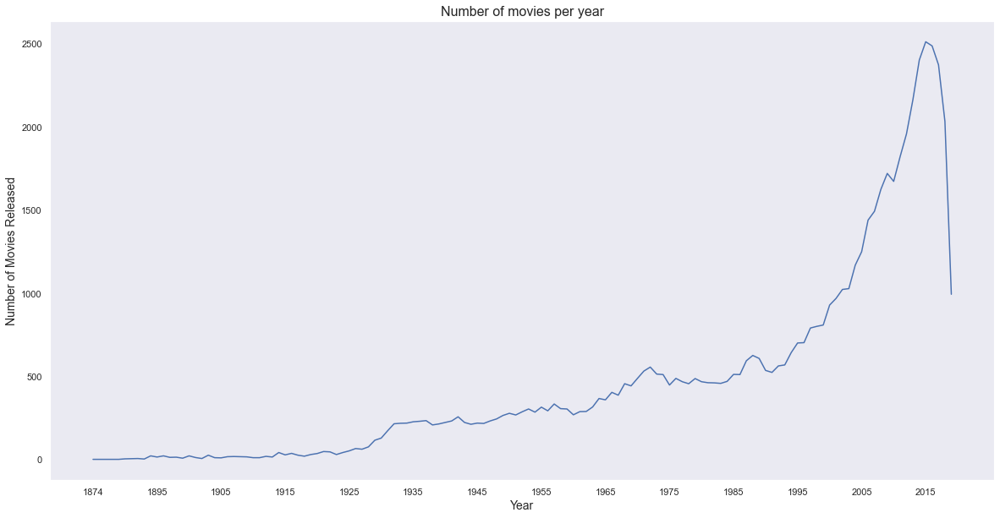

In [51]:
# return number of rows by the year 
year_counts = movies[["title", "movie_year"]].groupby("movie_year").size()

fig, ax = plt.subplots(figsize=(20, 10)) 
ax.plot(year_counts.index, year_counts.values)
ax.xaxis.set_major_locator(plt.MaxNLocator(15)) # changes the number of xticks we see
plt.title("Number of movies per year", fontsize=16)
plt.xlabel("Year", fontsize= 14)
plt.ylabel("Number of Movies Released", fontsize=14)
plt.show()

We can see that as the years go by, the total number of movies released per year increases. This might be because as technology advances, more movies are released and also more money is generated through the movie industries so everyone will want to release their movies

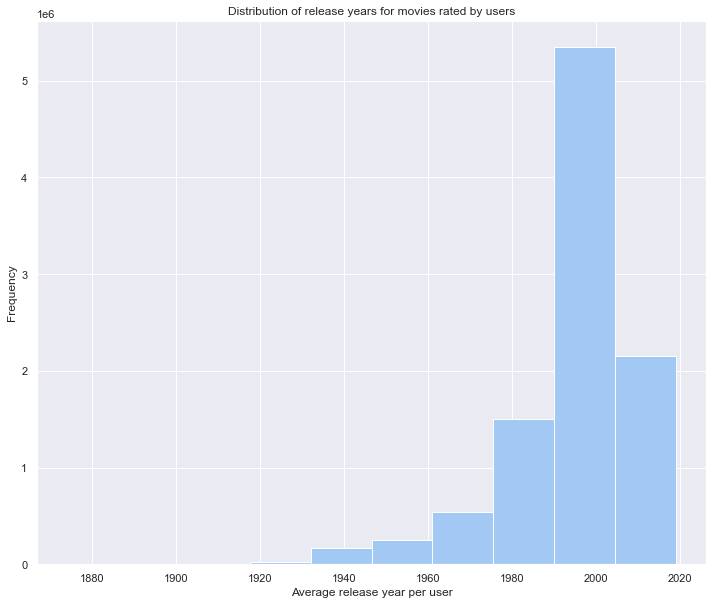

In [52]:
# Create 'year' df that averages release year for each user
years = pd.merge(train, movies, on='movieId')[['userId','movie_year']].dropna()
years['year'] = years['movie_year'].astype('int64')
years.groupby('userId').mean()


# Set plot size
sns.set(rc={'figure.figsize':(20,10)}, palette='pastel')


plt.figure(figsize=(12,10))
years['year'].plot(kind='hist')
plt.ylabel('Frequency')
plt.xlabel('Average release year per user')
plt.title('Distribution of release years for movies rated by users')
plt.show()

The above graph shows an increasing trend in movie releases since 1995.The years 2015 and 2016 are the years where the highest number of movies were released.What the diagram above communicates to us is that as the years progress, the amount of movies being released have significantly increased.

An indication as to how rating counts vary by day of week

In [76]:
# Convert the timestamp values into datetime format

train['timestamp'] = pd.to_datetime(train['timestamp'], unit='ms')
train.head()

,userId,movieId,rating,timestamp
0,5163,57669,4.0,1970-01-18 13:45:49.992
1,106343,5,4.5,1970-01-14 23:03:58.739
2,146790,5459,5.0,1970-01-13 10:56:55.539
3,106362,32296,2.0,1970-01-17 11:17:22.565
4,9041,366,3.0,1970-01-10 15:29:35.837


In [77]:
# Extract the day of the week from the newly-formatted timestamp column

train['day_of_week'] = train['timestamp'].dt.dayofweek
days = {0:'Mon',1:'Tue',2:'Wed',3:'Thur',4:'Fri',5:'Sat',6:'Sun'}
train['day_of_week'] = train['day_of_week'].apply(lambda x: days[x])
train.tail()

,userId,movieId,rating,timestamp,day_of_week
10000033,136395,99114,5.0,1970-01-18 14:33:55.092,Sun
10000034,140078,553,3.0,1970-01-12 14:29:40.977,Mon
10000035,154807,56782,4.0,1970-01-15 05:01:14.807,Thur
10000036,85805,327,4.0,1970-01-18 03:05:21.530,Sun
10000037,139457,1009,4.0,1970-01-10 22:36:24.862,Sat


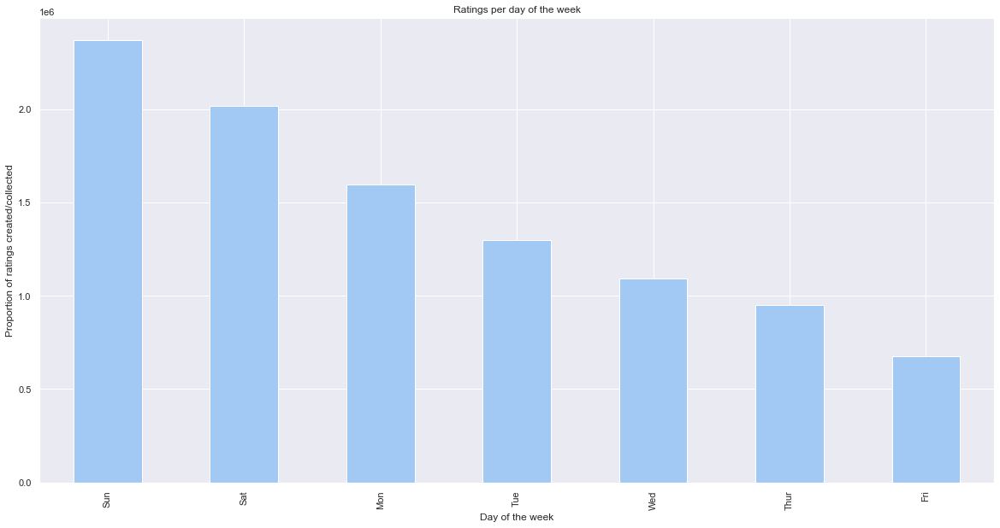

In [55]:
# Plot number of ratings by day of week

train['day_of_week'].value_counts().plot(kind='bar')
plt.title('Ratings per day of the week')
plt.xlabel('Day of the week')
plt.ylabel('Proportion of ratings created/collected')
plt.show()

We calcated the average rating for each day of the week and we can see that we received the most ratings on a Sunday and on a Saturday. This is the time where users are more settled at home as this is during the weekend and thats the time that most users would have time to watch movies.

### Top 10 number of ratings per movie

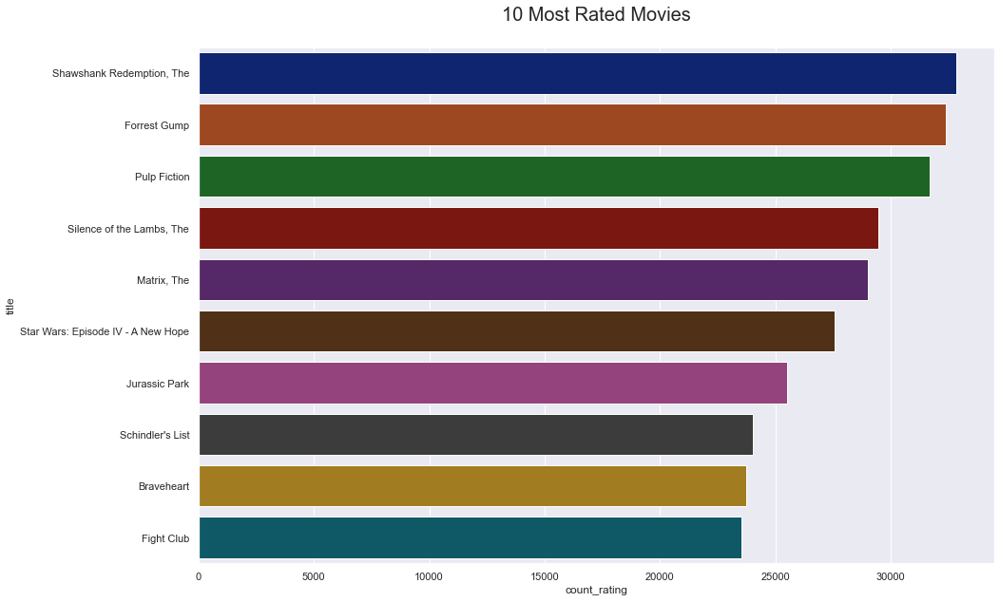

In [56]:
# 10 Most Rated Movies
data = train.groupby('movieId')['rating'].size().sort_values(ascending=False)
da = {'count_rating': data.values, 'movieId': data.index}


# Create DataFrame.
df = pd. DataFrame(da)
df = df[:10]
df = pd.merge(df,movies)

# Plot the 10 Most Rated Movies
plot = plt.figure(figsize=(15, 10))
plt.title('10 Most Rated Movies\n', fontsize=20)
sns.barplot(y="title", data=df,
              x = 'count_rating',
              palette="dark")


plt.show()

The most rated movie 'The Shawshank redemption' is a movie about Andy Dufresne (Tim Robbins) who is sentenced to two consecutive life terms in prison for the murders of his wife and her lover and is sentenced to a tough prison. However, only Andy knows he didn't commit the crimes. While there, he forms a friendship with Red (Morgan Freeman), experiences brutality of prison life, adapts, helps the warden, etc., all in 19 years.

### 10 least rated movies

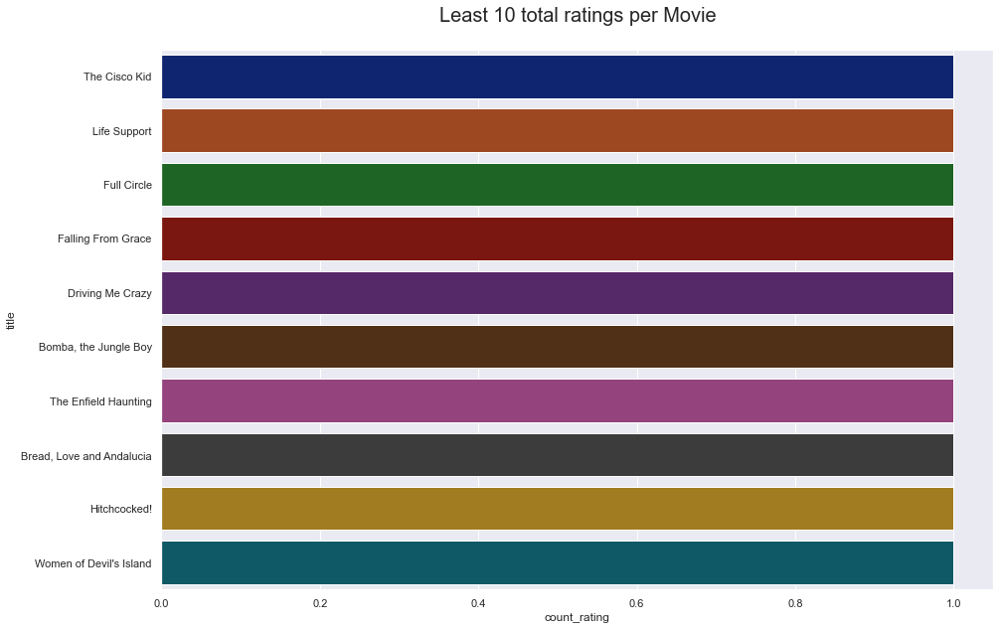

In [57]:
# 10 Least Rated Movies
data = train.groupby('movieId')['rating'].size().sort_values(ascending=False)
da = {'count_rating': data.values, 'movieId': data.index}


# Create DataFrame.
df = pd. DataFrame(da)
df = df[-10:]
df = pd.merge(df,movies)

# Plot the 10 Least Rated Movies
plot = plt.figure(figsize=(15, 10))
plt.title('Least 10 total ratings per Movie\n', fontsize=20)
sns.barplot(y="title", data=df,
              x = 'count_rating',
              palette="dark")


plt.show()

The movies with the lowest ratings are movies that mostly portray strange situations, surprises, surrealism, plot twists, black humor. We would assume that a large number of people are not comfortable with those type of movies.

In [58]:
#Create variable "budget_per_genre"

budget_per_genre=movies_imdb[['genres','budget']].explode('genres')
budget_per_genre['budget']=budget_per_genre['budget'].str.replace(',', "").str.extract('(\d+)', expand=False).astype('float')


budget_per_genre

,genres,budget
0,Adventure|Animation|Children|Comedy|Fantasy,30000000.0
1,Adventure|Children|Fantasy,65000000.0
2,Comedy|Romance,25000000.0
3,Comedy|Drama|Romance,16000000.0
4,Comedy,30000000.0
...,...,...
62418,Drama,NaN
62419,Documentary,NaN
62420,Comedy|Drama,NaN
62421,(no genres listed),NaN


In [59]:
budget_per_genre.genres = budget_per_genre.genres.apply(lambda x: x.split('|'))


budget_per_genre = pd.DataFrame([(tup.budget, d) for tup in budget_per_genre.itertuples() for d in tup.genres],
                             columns=['budget', 'genres'])

budget_per_genre.dropna()

,budget,genres
0,30000000.0,Adventure
1,30000000.0,Animation
2,30000000.0,Children
3,30000000.0,Comedy
4,30000000.0,Fantasy
...,...,...
55990,1000000.0,War
56017,35000000.0,Drama
56079,90000.0,Comedy
56080,90000.0,Horror


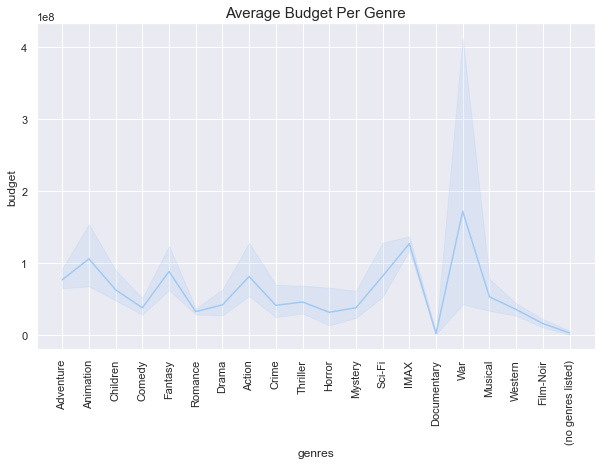

In [60]:
#Plotting an average budget per genre using a line-plot

plt.figure(figsize=(10,6))
axes=sns.lineplot(x="genres", y="budget", data=budget_per_genre)
axes.set_title('Average Budget Per Genre',fontsize=15)
plt.xticks(rotation=90)
plt.show()

Movies displayed on IMAX require the largest budget as IMAX are promoted as premium viewing options, thus have prices as high relative to regular-format movies as the market will bear. The extra costs of running an IMAX screening and the willingness of customers willing to pay the extra money for the IMAX experience.

The War genre clearly requires the biggest budget, and documentaries are the least expensive.

In [61]:
#visualising directors with the most ratings overall

genre_count=dfmovies_metadata['director'].value_counts() 
genre_count = genre_count.dropna()
genre_count = genre_count[:10]
genre_count=pd.DataFrame(genre_count).reset_index() 
popular_genre=genre_count.rename(columns={'index':'Directors','director':'Count of ratings'})
fig = px.bar(popular_genre, y='Count of ratings', x='Directors', text='Directors') 
fig.update_layout(title_text='<b>Common Directors<b>',title_x=0.5)
fig.show()

Quentin Tarantino, in full Quentin Jerome Tarantino is an american director and screenwriter whose films are noted for their stylized violence, razor-sharp dialogue, and fascination with film and pop culture.and he believes that crime can make a movie pop.Tarantino's films often feature graphic violence, a tendency which has sometimes been criticized.

### Runtime

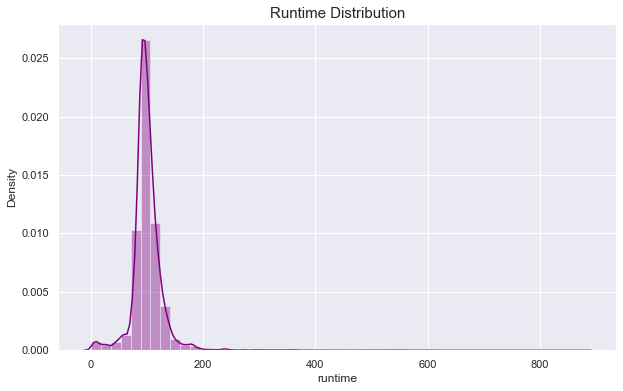

In [62]:
#Plotting distribution of movies's duration using dist-plot

plt.figure(figsize = (10,6))
axes=sns.distplot(imdb['runtime'],color='purple')
axes.set_title('Runtime Distribution',fontsize=15)
plt.show()

The most common duration of a movie is around 90 minutes.

In [63]:
imdb = pd.read_csv("imdb_data.csv")
movies = pd.read_csv("movies.csv")


movies_imdb= pd.merge(imdb,movies,on ='movieId',how ='inner')


#Create variable "runtime_genre"
runtime_per_genre=movies_imdb[['genres','runtime']].explode('genres')


runtime_per_genre.genres = runtime_per_genre.genres.apply(lambda x: x.split('|'))


runtime_per_genre = pd.DataFrame([(tup.runtime, d) for tup in runtime_per_genre.itertuples() for d in tup.genres],
                             columns=['runtime', 'genres'])

runtime_per_genre.dropna()

,runtime,genres
0,81.0,Adventure
1,81.0,Animation
2,81.0,Children
3,81.0,Comedy
4,81.0,Fantasy
...,...,...
49751,130.0,Adventure
49752,102.0,(no genres listed)
49753,96.0,Adventure
49754,96.0,Fantasy


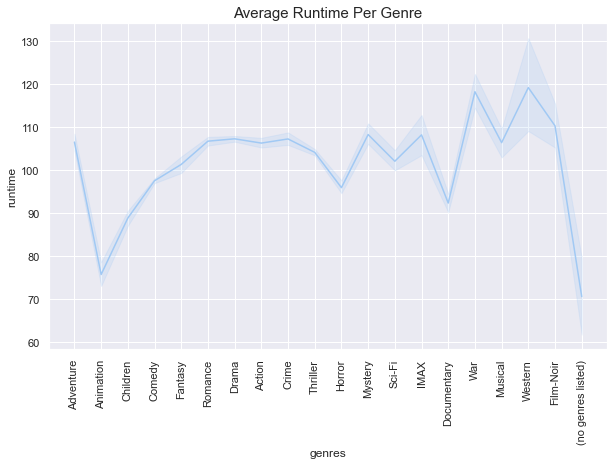

In [64]:
#Plotting an average runtime per genre using line-plot

plt.figure(figsize=(10,6))
axes=sns.lineplot(x="genres", y="runtime", data=runtime_per_genre)
axes.set_title('Average Runtime Per Genre',fontsize=15)
plt.xticks(rotation=90)
plt.show()

It can be observed that Western movies have the highest runtime whilst animation movies have the least runtime. We see that animation has the least runtime which is caused by the cost and the time involved, also because most animated films are aimed at children and children have a short attention span.

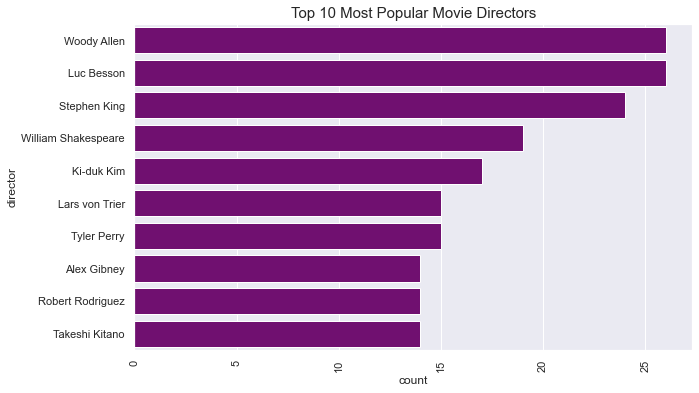

In [65]:
#Plotting top 10 movie directors using a count-plot

plt.figure(figsize = (10,6))
director=imdb['director']#.explode()
axes=sns.countplot(y=director, order = director.value_counts().index[1:11],color='purple')
axes.set_title('Top 10 Most Popular Movie Directors',fontsize=15)
plt.xticks(rotation=90)
plt.show()

A number of popular directors based on the number of movies they have directed. We can observe that the most popular movie director is Luc Besson,because he has directed the most movies.

In [66]:
imdb = pd.read_csv("imdb_data.csv")


imdb['title_cast']=imdb['title_cast'].fillna("Unknown")
imdb['plot_keywords']=imdb['plot_keywords'].fillna("Unknown")



# Create dataframe containing only the movieId and title cast
title_cast = pd.DataFrame(imdb[['movieId', 'title_cast']],
                             columns=['movieId', 'title_cast'])


# Create dataframe containing only the movieId and keywords
plot_keywords = pd.DataFrame(imdb[['movieId', 'plot_keywords']],
                             columns=['movieId', 'plot_keywords'])


# Split genres seperated by "|" and create a list containing the genres allocated to each movie
title_cast.title_cast = title_cast.title_cast.apply(lambda x: x.split('|'))
plot_keywords.plot_keywords = plot_keywords.plot_keywords.apply(lambda x: x.split('|'))



# Create expanded dataframe where each movie-genre combination is in a seperate row
title_cast = pd.DataFrame([(tup.movieId, d) for tup in title_cast.itertuples() for d in tup.title_cast],
                             columns=['movieId', 'title_cast'])
plot_keywords = pd.DataFrame([(tup.movieId, d) for tup in plot_keywords.itertuples() for d in tup.plot_keywords],
                             columns=['movieId', 'plot_keywords'])




title_cast.head()

,movieId,title_cast
0,1,Tom Hanks
1,1,Tim Allen
2,1,Don Rickles
3,1,Jim Varney
4,1,Wallace Shawn


In [67]:
title_cast=title_cast[title_cast!= "Unknown"]
title_cast

,movieId,title_cast
0,1,Tom Hanks
1,1,Tim Allen
2,1,Don Rickles
3,1,Jim Varney
4,1,Wallace Shawn
...,...,...
249353,131262,Mikal Evans
249354,131262,Daniel Zovatto
249355,131262,Evelina Turen
249356,131262,Rachel Heller


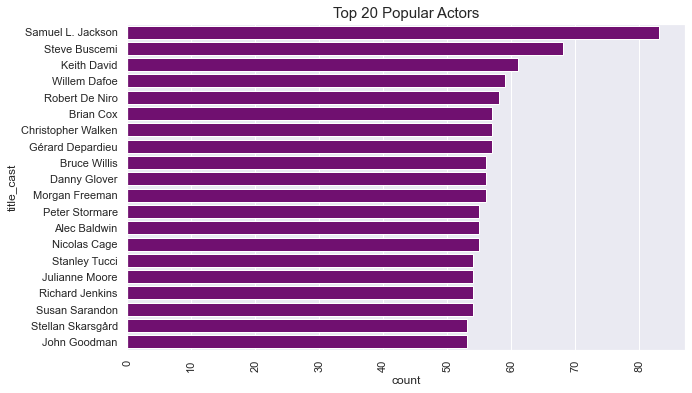

In [68]:
#Plotting popular cast using a count-plot

plt.figure(figsize = (10,6))
title_cast=title_cast.title_cast.explode()
ax=sns.countplot(y=title_cast, order = title_cast.value_counts().index[:20],color='purple')
ax.set_title('Top 20 Popular Actors',fontsize=15)
plt.xticks(rotation=90)
plt.show()

Samuel L Jackson seems to be the most popular actor as he appeared in over 80 movies from our database.

<a id="11"></a>

***
## **Recommender Choice**
***

The two filtering recommender systems are categorised as content based and collabortive. The image below is a summary of the type of features that each system could use to make recommendations.

Next is a summary of how each system creates recommendations, how it genereates predictions, its drawbacks, and then we finally delve into the modelling.

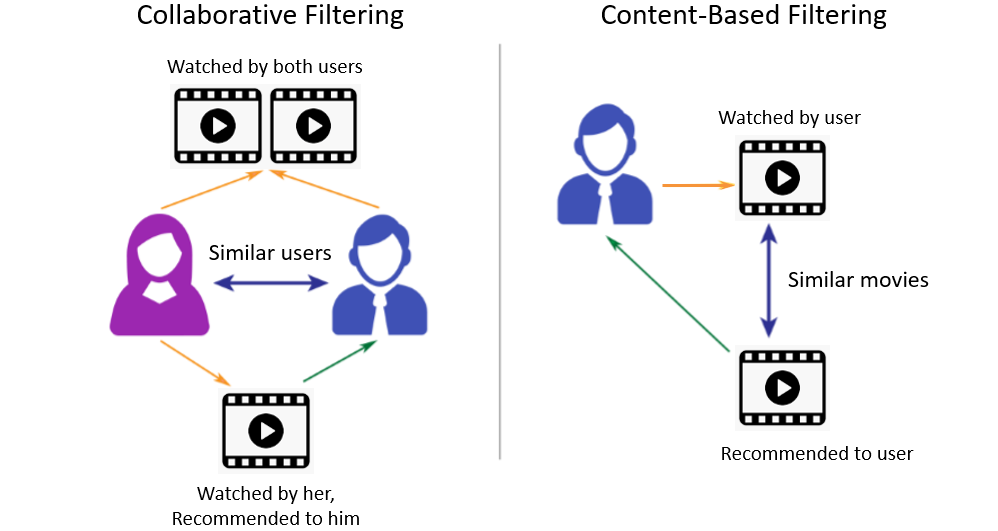

### Content Based: 

Content Based movie recommender systems suggest items based on similarity to a movie that they already positively rated/interacted with. In the context of movies, such a system could use features such as director, cast, genre or description of a movie to make recommendations.

Though content-based filtering doesn't need any data about users to make recommendations, a drawback is it tends to return on average items in a similar category with little variation across the recommendations.

### Collaborative Filtering:


Collaborative filtering movie recommender systems are said to be more widely used and make recommendations to users based on the similarity between users, in this case it would be the recommendation of a movie or the likely prediction a user could rate a movie based on the ratings of similar users.

Though they are widely used in the industry, one of the drawbacks of collaborative filtering is the so called 'cold start problem' when it comes to new users, as the system does not have sufficient data on the user to make accurate predictions.

Unlike content based methods, collaborative algorithms return more varied results, enabling the business to introduce users to new types of content, hence increasing viewage and profit. It is for this reason that we use Collaborative filtering as our main approach. The tested models are all implemented from sklean's 'surprise' package. The algorithms are tested below and their results summarised in the table in the comet section.

<a id="12"></a>
***
## **Data Engineering**
***

In [78]:
train.head()

,userId,movieId,rating,timestamp,day_of_week
0,5163,57669,4.0,1970-01-18 13:45:49.992,Sun
1,106343,5,4.5,1970-01-14 23:03:58.739,Wed
2,146790,5459,5.0,1970-01-13 10:56:55.539,Tue
3,106362,32296,2.0,1970-01-17 11:17:22.565,Sat
4,9041,366,3.0,1970-01-10 15:29:35.837,Sat


In [79]:
# We'll drop the 'timestamp' column as it is unnecessary for the modelling part of our notebook
train.drop(["timestamp", "day_of_week"], axis=1, inplace=True)
train.head()

,userId,movieId,rating
0,5163,57669,4.0
1,106343,5,4.5
2,146790,5459,5.0
3,106362,32296,2.0
4,9041,366,3.0


In [80]:
# We will filter out movies that have less than 20 ratings and users with less than 5 ratings given

min_ratings = 20
filter_movies = train['movieId'].value_counts() > min_ratings
filter_movies = filter_movies[filter_movies].index.tolist()

min_user_ratings = 5
filter_users = train['userId'].value_counts() > min_user_ratings
filter_users = filter_users[filter_users].index.tolist()

df_new = train[(train['movieId'].isin(filter_movies)) & (train['userId'].isin(filter_users))]
print('The original data frame shape:\t{}'.format(train.shape))
print('The new data frame shape:\t{}'.format(df_new.shape))

The original data frame shape:	(10000038, 3)
The new data frame shape:	(9848791, 3)


<a id="14"></a>
***
## **Modelling**
***

In [ ]:
# Define sample size of 9 000 000 taken from train dataset
# The samples are taken without replacement
df_new_sample = df_new.sample(n = 9800000, replace = False)
# Define the Reader object by specifying the rating scale in the dataset
reader = Reader(rating_scale=(0.5, 5), line_format='user item rating') 
# Load the dataset from the pandas dataframe
data = Dataset.load_from_df(df_new_sample, reader)

# Splitting dataset into train and validation sets
train_set, val_set = train_test_split(data, test_size=0.15, random_state=42)

#### NormalPredictor 

The Normal Predictor algorithm predicts a random rating for each movie based on the distribution of the training set, which is assumed to be normal.

In [ ]:
np_test = NormalPredictor()
np_test.fit(train_set)
nppredictions = np_test.test(val_set)
# Calculate RMSE
np_rmse = accuracy.rmse(nppredictions)
    
# Dictionary for the data to log for the NMF model
params = {'model_name': 'NP'}
metrics = {'RMSE': surprise.accuracy.rmse(nppredictions,verbose=True)}

# Log the parameters and results for the NMF model
experiment.log_parameters(params)
experiment.log_parameters(metrics)
# End the experiment for the NMF experiment
experiment.end()


#### KNN Basic

The 'KNNBasic' is a basic nearest-neighbor based collaborative filtering algorithm derived from the
basic nearest-neighbor approach.

In [ ]:
# Modeling
sim_options = {'name': 'cosine',
               'user_based': False  # compute  similarities between items
               }

knn_basic = KNNBasic(sim_options=sim_options)
knn_basic.fit(train_set)
knn_basicpredictions = knn_basic.test(val_set)
# Calculate RMSE
knn_basic_rmse = accuracy.rmse(knn_predictions)

# Dictionary for the data to log for KNN basic model
params = {'k': 40, 'sim_options': {'name': 'cosine', 'user_based': False},
          'model_type': 'KNN_basic'}
metrics = {'RMSE': surprise.accuracy.rmse(predictionsKNN, verbose=True)}

# Log the parameters and results for the KNN basic model
experiment.log_parameters(params)
experiment.log_parameters(metrics)

# End the experiment for the KNN basic experiment
experiment.end()


#### KNNBaseline

The 'KNNBaseline' is also a basic nearest-neighbor based collaborative filtering algorithm which
takes mean rating of each user into account.

In [ ]:
# Modeling
    
knn_baseline = KNNBaseline(sim_options=sim_options)
knn_baseline.fit(train_set)
knn_baselinepredictions = knn_basic.test(val_set)
# Calculate RMSE
knn_basic_rmse = accuracy.rmse(knn_baselinepredictions)

# Dictionary for the data to log for KNNBaseLine model
params = {'model_name': 'KNNBaseLine'}
metrics = {'RMSE': surprise.accuracy.rmse(knn_baselinepredictions, verbose=True)}

# Log the parameters and results for the KNNBaseLine model
experiment.log_parameters(params)
experiment.log_parameters(metrics)
# End the experiment for the KNNBaseLine experiment
experiment.end()

#### CoClustering

This is an implementation of collaborating filtering algorithm based on co-clustering. In this
algorithm, users and items are classified into different clusters and co-clusters.

In [ ]:
# Modeling
    
coc= CoClustering(random_state=42)
coc.fit(train_set)
cocpredictions = coc.test(val_set)
# Calculate RMSE
coc_rmse = accuracy.rmse(cocpredictions)


# Dictionary for the data to log for CoClustering model
params = {'user_cluster': 4, 'item_cluster': 4,
          'n_ephocs': 25, 'model_name': 'CoClustering'}
metrics = {'RMSE': surprise.accuracy.rmse(cocpredictions, verbose=True)}

# Log the parameters and results for the CoClustering model
experiment.log_parameters(params)
experiment.log_parameters(metrics)

# End the experiment for the CoClustering experiment
experiment.end()

#### Baseline Only 

The 'BaselineOnly' algorithm predicts the baseline estimate for a given user. 

In [ ]:
# Modeling
    
bsl_choice= {'method': 'sgd','n_epochs': 40}
blo = BaselineOnly(bsl_options=bsl_choice)
blo.fit(train_set)
blopredictions = blo.test(val_set)
# Calculate RMSE
blo_rmse = accuracy.rmse(blopredictions)
# Dictionary for the data to log for BLO model
paramns = {'model_name': 'BaseLineOnly'}
metrics = {'RMSE': surprise.accuracy.rmse(blopredictions, verbose=True)}

# Log the parameters and results for the BLO model
experiment.log_parameters(params)
experiment.log_parameters(metrics)

# End the experiment for the BLO experiment
experiment.end()


#### BaselineTuned

This is the baseline algorithm with tuned hyperparameters

In [ ]:
# Modeling
train_set, val_set = train_test_split(data, test_size=0.15, random_state=42)
bsl_options = {'method': 'als',
               'n_epochs': 5,
               'reg_u': 12,
               'reg_i': 5
               }
bl_algo = BaselineOnly(bsl_options=bsl_options)
cross_validate(bl_algo, data, measures=['RMSE'], cv=5, verbose=False)
bl_predictions = bl_algo.fit(train_set).test(val_set)
accuracy.rmse(bl_predictions)

# Dictionary for the data to log for baseline_tuned model
params = {'model_name': 'Baseline_tuned'}
metrics = {'RMSE': accuracy.rmse(bl_predictions)}

# Log the parameters and results for the baseline_tuned model
experiment.log_parameters(params)
experiment.log_parameters(metrics)
# End the experiment for the baseline_tuned experiment
experiment.end()


#### KNNWithMeans

The 'KNNMeans' is also a basic nearest-neighbor based collaborative filtering algorithm which
takes mean rating of each user into account.

In [ ]:
# Modeling

knnmeans = KNNWithMeans(sim_options=sim_options)
knnmeans.fit(train_set)
knnmeanspredictions = knnmeans.test(val_set)
# Calculate RMSE
knnmeans_rmse = accuracy.rmse(knnmeanspredictions)
# Dictionary for the data to log for KNNMeans model
params = {'model_name': 'KNNWithMeans'}
metrics = {'RMSE': surprise.accuracy.rmse(knnmeanspredictions, verbose=True)}

# Log the parameters and results for the KNNMeans model
experiment.log_parameters(params)
experiment.log_parameters(metrics)
# End the experiment for the KNNMeans experiment
experiment.end()

#### KNNWithZscore

The 'KNNWithZScore' is also a basic nearest-neighbor based collaborative filtering algorithm which
takes the z-score normalization of each user into account.

In [ ]:
# Modeling

knnzsco = KNNWithZScore(sim_options=sim_options)
knnzsco.fit(train_set)
knnzsco_predictions = knnmeans.test(val_set)
# Calculate RMSE
knnmeans_rmse = accuracy.rmse(knnmeanspredictions)
# Dictionary for the data to log for KNNWithZScore model
params = {'model_name': 'KNNWithZscore'}
metrics = {'RMSE': surprise.accuracy.rmse(knnzsco_predictions, verbose=True)}

# Log the parameters and results for the KNNWithZscore model
experiment.log_parameters(params)
experiment.log_parameters(metrics)
# End the experiment for the KNNWithZscore experiment
experiment.end()

#### NMF  

NMF is a collaborative filtering algorithm based on Non-negative Matrix Factorization. The optimization procedure is a (regularized) stochastic gradient descent with a specific choice of step size that ensures non-negativity of factors, provided that their initial values are also positive.

In [ ]:
nmf = NMF()
nmf.fit(train_set)
nmfpredictions = nmf.test(val_set)
#Calculate RMSE
nmf_rmse = accuracy.rmse(nmfpredictions)
    
# Dictionary for the data to log for the NMF model
params = {'model_name': 'NMF'}
metrics = {'RMSE': surprise.accuracy.rmse(nmfpredictions,verbose=True)}

# Log the parameters and results for the NMF model
experiment.log_parameters(params)
experiment.log_parameters(metrics)
# End the experiment for the NMF experiment
experiment.end()

#### SVD

Singular value decomposition, or SVD, is a type of matrix analysis technique
that allows us to represent a high-dimensional matrix in a lower dimension.
SVD achieves this by identifying and removing the less important parts of
the matrix and producing an approximation in the desired number of
dimensions.

The SVD approach to collaborative filtering was first proposed by Simon
Funk and proved to be extremely popular and effective during the Netflix
prize competition. Understanding SVD requires a grasp of
linear algebraic topics that are beyond the scope of this notebook. However, we
will use a black box implementation of the SVD collaborative filter as
provided by the surprise package.

In [ ]:
# Define the SVD algorithm class
svd_algo = SVD()
# Fitting the model on the train_set
svd_algo.fit(train_set)
# Predicting on the validation set
svd_predictions = svd_algo.test(val_set)
# Calculating the RMSE of the predictions
accuracy.rmse(svd_predictions)

# Dictionary for the data to log for SVD model
params = {'model_name': 'SVD'}
metrics = {'RMSE': accuracy.rmse(svd_predictions)}

# Log the parameters and results for the SVD model
experiment.log_parameters(params)
experiment.log_parameters(metrics)
# End the experiment for the SVD experiment
experiment.end()


<a id="15"></a>
***
## **Hyperparameter Tuning**
***

In [ ]:
rating_scale = Reader(rating_scale=(0.5, 5))
train_df = Dataset.load_from_df(train.drop('timestamp', axis=1), rating_scale)

# Training and validation set split for hypertuning
train_set, val_set = train_test_split(train_df,
                                      test_size=0.008,
                                      random_state=42)

# Modelling of the SVD hypertuning
svd_algo_hyper = SVD(n_factors=160, 
                     lr_all=0.0085,
                     reg_all=0.02,
                     n_epochs=20,
                     init_std_dev=0.01)
svd_algo_hyper.fit(train_set)

# Predicting on the validation set
svd_hyper_predictions = svd_algo_hyper.test(val_set)

# Convert the predictions to dataframe
#test = pd.DataFrame(predictions)
accuracy.rmse(svd_hyper_predictions)

# Dictionary for the data to log for the SVD tuned model
params = {'model_name': 'SVD_Tuned'}
metrics = {'RMSE': accuracy.rmse(svd_hyper_predictions)}

# Log the parameters and results for the SVD tuned model
experiment.log_parameters(params)
experiment.log_parameters(metrics)
# End the experiment for the SVD tuned experiment
experiment.end()

In [ ]:
pred_svd_hyper = [svd_algo_hyper.predict(row.userId,
                                         row.movieId) for idx,row in test.iterrows()]

# Converting the predictions to a dataframe
test_pred_svd_hyper = pd.DataFrame(pred_svd_hyper)

In [ ]:
#renaming the fields of the prediction dataframe
test_pred_svd_hyper.drop(['r_ui', 'details'], axis=1, inplace=True)
test_pred_svd_hyper = test_pred_svd_hyper.rename(columns={'uid':'userId',
                                                          'iid':'movieId',
                                                          'est':'rating'})
test_pred_svd_hyper.head()

In [ ]:
# Concatenating each userId and movieId to a single Id column for submission
test_pred_svd_hyper['Id'] =  test_pred_svd_hyper['userId'].astype(str).str.zfill(1) + '_' + test_pred_svd_hyper['movieId'].astype(str).str.zfill(1)

In [ ]:
svd_hyper_predictions = test_pred_svd_hyper[['Id','rating']]
svd_hyper_predictions.head()

<a id="16"></a>
***
## **Export Best Prediction to CSV**
***


In [ ]:

svd_hyper_predictions.to_csv("Submission.csv", index=False)

<a id="17"></a>
***
## **Pickling Models for Streamlit**
***


In [ ]:
# Pickle the KNN model for content-based filtering
pickle.dump(model, open(save_path,'wb'))
model_save_path = "content_based_filter.pkl"
with open(model_save_path, 'wb') as file:
    pickle.dump(collabKNN, file)

# Pickle the svd model for collaborative filtering
pickle.dump(model, open(save_path,'wb'))
model_save_path = "collab_filter_recommender.pkl"
with open(model_save_path, 'wb') as file:
    pickle.dump(svd_algo_hyper, file)


<a id="18"></a>
***
## **Conclusion**
***

-Recommendation systems predict according to previous experience.

-There are two methods for Collaborative Filtering: User based and Item based.

-Recommendation sytems have much broader application than just in movies. They are used in e-commerce stores and music streaming platforms.

-Somewhat beyond the scope of this notebook, we can also build recommender system based on 'metadata' or data about the movie, for example, users may search for movies based on directors,actors or plots


<a id="19"></a>
***
## **Acknowledgements**
***

 - https://www.kaggle.com/code/ibtesama/getting-started-with-a-movie-recommendation-system
 - https://www.youtube.com/watch?v=oBAiEtWi4Rc
 - https://www.bing.com/videos/search?q=scikit+surprise&&view=detail&mid=099AD6CE66C6BEF84151099AD6CE66C6BEF84151&rvsmid=155A59CBE780D74184D7155A59CBE780D74184D7&FORM=VDRVRV
 - http://surpriselib.com/#:~:text=Surprise%20is%20a%20Python%20scikit,perfect%20control%20over%20their%20experiments.
 - https://www.youtube.com/watch?v=-IM3531b1XU&t=576s